### Tweeter NLP Data
#### 1. Imports and EDA

In [11]:
# !pip install nltk
# !pip freeze | grep -E 'ydata-profiling|visions'

  Using cached regex-2024.11.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (40 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 6.7 MB/s eta 0:00:007.8 MB/s eta 0:00:01
Using cached regex-2024.11.6-cp312-cp312-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (796 kB)


In [18]:
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport
from ydata_profiling.config import Settings

import nltk
from nltk.corpus import stopwords
import re
from wordcloud import WordCloud
import matplotlib.pyplot as plt

config = Settings()
# Disable chi-square test for numeric variables
config.vars.num.chi_squared_threshold = 0.0

%load_ext autoreload
%autoreload 2
%matplotlib inline

df_raw = pd.read_csv('./data/nlp_tweet/tweet_data.csv')
df = df_raw.copy()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
df.sample(15).T

,748696,611281,783536,665531,401642,176845,758406,486060,134629,456519,239131,618113,392536,93984,567030
tweetID,1151372965751250945,1139536739905822720,1154070948376731648,1144172302504013824,1117744535222800389,1093862079751163904,1152046658219401216,1125730050832240641,1088912718340505600,1123346289037533184,1101015657100005376,1140239402284851201,1116698769469452295,1084179227719680000,1135895240001409024
crDate,2019-07-17 06:08:01,2019-06-14 14:15:05,2019-07-24 16:48:50,2019-06-27 09:15:09,2019-04-15 11:00:38,2019-02-08 13:20:17,2019-07-19 02:45:01,2019-05-07 11:52:13,2019-01-25 21:33:17,2019-04-30 22:00:00,2019-02-28 07:06:03,2019-06-16 12:47:12,2019-04-12 13:45:08,2019-01-12 20:04:05,2019-06-04 13:05:03
edInput,4,-1,-1,2,1,-1,1,-1,-1,-1,2,2,1,-1,1
editor,5008,-1,-1,5003,5002,-1,5007,-1,-1,-1,5003,5008,5002,-1,5007
engages,210,49,219,517,51,37,13,9,98,7,303,37,1170,39,163
isApproved,False,False,False,False,True,False,True,False,False,False,False,False,True,False,True
isEdNeed,True,True,True,True,True,True,True,True,True,True,True,True,True,True,True
isRT,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False
likes,167,34,166,406,47,28,10,6,77,6,245,27,966,20,153
photoUrl,https://pbs.twimg.com/media/D_p_nDYXoAAmoKY.jpg,NaN,https://pbs.twimg.com/media/EAQVaV_WkAA8BrG.jpg,NaN,https://pbs.twimg.com/media/D4MGu0WWsAUyJZq.jpg,https://pbs.twimg.com/media/Dy4tw7DWsAEBCYo.jpg,https://pbs.twimg.com/media/D_zkVJHWwAAQav3.jpg,NaN,NaN,NaN,https://pbs.twimg.com/media/D0eX4_wXcAAUSQS.jpg,NaN,https://pbs.twimg.com/media/D39PnM8XoAEp4tr.jpg,NaN,https://pbs.twimg.com/media/D8OCszSXkAACLQz.jpg


In [6]:
profile = ProfileReport(df, title='Tweet Profile Report', explorative=True, config=config)
profile.to_file('tweet_EDA_report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

### 2. Feature Selections

In [9]:
df_reduced = df[['editor', 'topicName', 'text', 'edInput']].copy()
df_reduced.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 785916 entries, 0 to 785915
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   editor     785916 non-null  int64 
 1   topicName  785916 non-null  object
 2   text       785916 non-null  object
 3   edInput    785916 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 24.0+ MB


In [13]:
# nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /home/oem/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [14]:
stop_words = set(stopwords.words('english'))

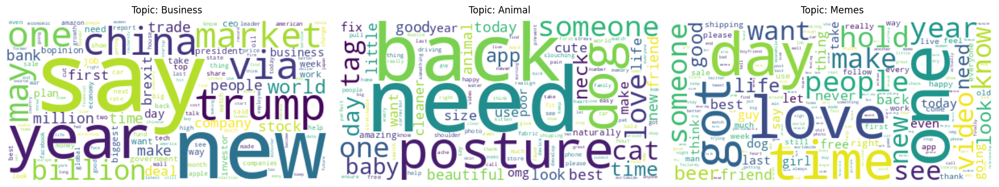

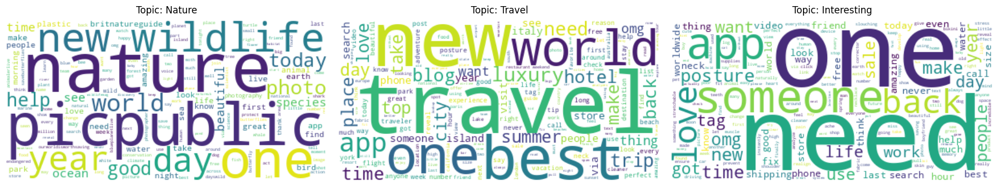

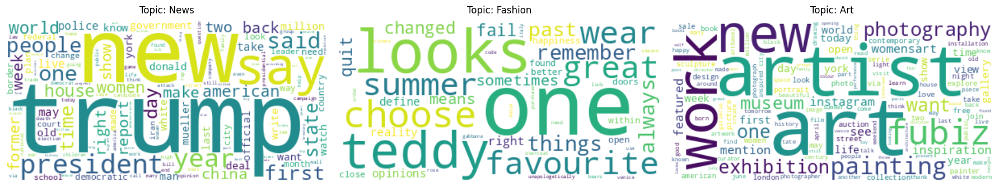

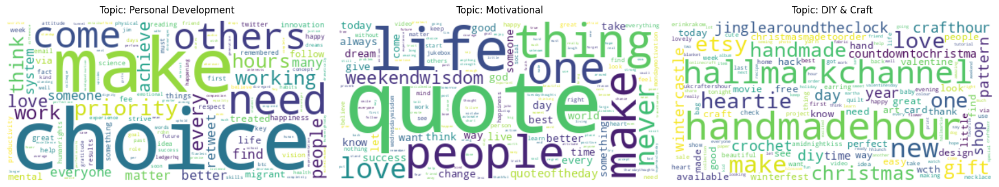

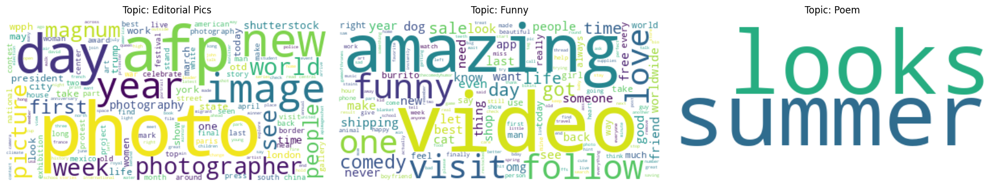

...

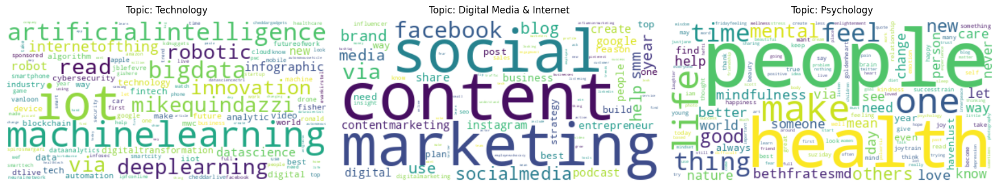

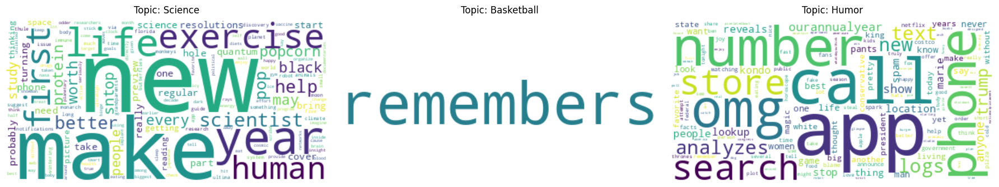

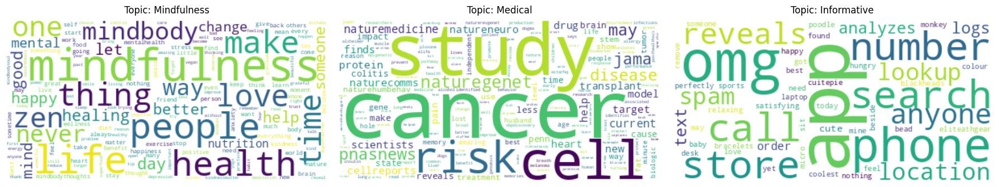

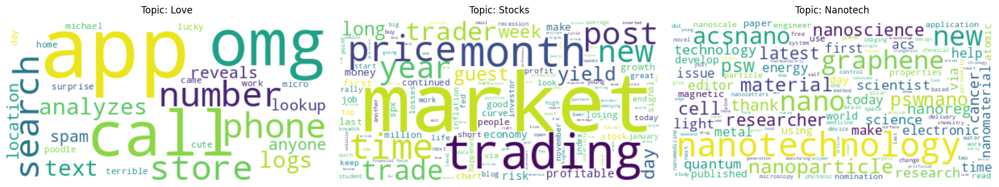

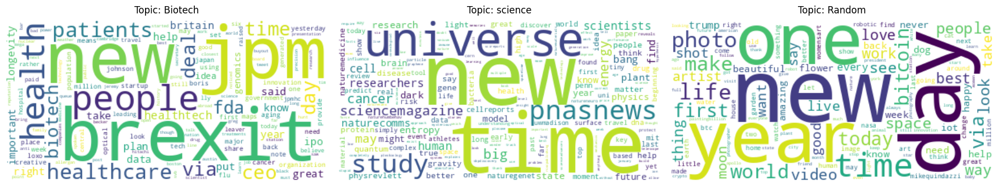

In [21]:
# Define a text-cleaning function
# Generate word clouds for each topicName
# We group rows by topicName, concatenate the cleaned text, and make a WordCloud.

stop_words = set(stopwords.words('english'))

def cleanup_text(text):
    # Remove URLs
    text = re.sub(r'https?://\S+', '', text)
    # Keep only letters + whitespace; make lowercase
    text = re.sub(r'[^a-zA-Z\s]', ' ', text).lower()
    # Tokenize on whitespace
    tokens = text.split()
    # Remove stopwords
    tokens = [t for t in tokens if t not in stop_words]
    # Keep tokens > 2 characters, purely alphabetical
    tokens = [t for t in tokens if t.isalpha() and len(t) > 2]
    return ' '.join(tokens)

df_reduced['cleaned_text'] = df_reduced['text'].apply(cleanup_text)

topics = df_reduced['topicName'].unique()

chunk_size = 3
for i in range(0, len(topics), chunk_size):
    # For this figure, grab up to 3 topics
    chunk = topics[i:i+chunk_size]
    
    # Create one figure to hold up to 3 columns
    # Adjust figsize as you like
    fig = plt.figure(figsize=(18, 6))

    for j, topic in enumerate(chunk):
        # Gather text for this topic
        group = df_reduced[df_reduced['topicName'] == topic]
        all_text = " ".join(group['cleaned_text'])
        
        # Generate the word cloud
        wordcloud = WordCloud(background_color='white', 
                              collocations=False
                             ).generate(all_text)
        
        # Manually place an Axes in the figure:
        # e.g., 3 columns => each ~0.33 wide
        left = 0.01 + 0.33*j   # shift each axis horizontally
        ax = fig.add_axes([left, 0.05, 0.32, 0.85]) 
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.set_title(f"Topic: {topic}", pad=10)
        ax.axis("off")
    
    # Show the figure for this set of 3 topics
    plt.show()
    plt.close(fig)